In [1]:
from skimage.io import imread
from skimage import img_as_float
from sklearn.cluster import KMeans
import numpy as np
import pylab
import math

/home/egor/anaconda3/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/egor/anaconda3/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/egor/anaconda3/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/egor/anaconda3/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [2]:
image = imread('parrots.jpg')
#print(image.shape)

In [3]:
image = img_as_float(image)
print(image.shape)


(474, 713, 3)


In [4]:
features = []
for i in range(len(image)):
    for j in range(len(image[0])):
        features.append(image[i][j])
features = np.array(features)

In [5]:
print(features.shape)

(337962, 3)


go mid
sred =  14.3678179408688
mid =  14.005928721924676


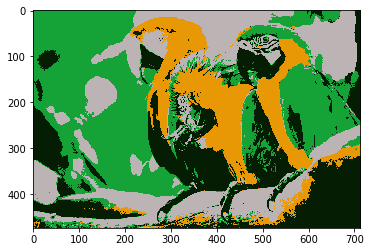

In [20]:
err= 0
err2 = 0
clf = KMeans(n_clusters=4, init='k-means++', random_state=241)
y = clf.fit_predict(features)
err, err2 = check(y,features)

In [6]:
clf = KMeans(init='k-means++', random_state=241)
y = clf.fit_predict(features)

In [16]:
def psnr(img1, img2):
    mse = np.mean( (img1 - img2) ** 2 )
    PIXEL_MAX = 1.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

In [8]:
def search_sred(y, f):
    k = np.unique(y)
    mas = np.zeros((len(k),3))
    count = np.zeros(len(k))
    for i in range(len(features)):
        for j in range(len(k)):
            if y[i] == j:
                mas[j] += features[i]
                count[j] += 1
    sred = []
    for i in range(len(k)):
        sred.append(mas[i]/count[i])
    image = np.array(f)
    for i in range(len(image)):
        for j in range(len(sred)):
            if y[i] == j:
                image[i] = sred[j]
    return image

In [9]:
def check(y,features):
    im = search_sred(y, features)
    im2 = search_mid(y,features)
    k2 = im2.reshape(474,713,3)
    k = im.reshape(474, 713,3)    
    pylab.imshow(k)
    err = psnr(features,im)
    print("sred = ", err)
    pylab.imshow(k2)
    err2 = psnr(features, im2)
    print("mid = ", err2)
    return err, err2

In [13]:
def search_mid (y, f):
    print("go mid")
    k = np.unique(y)
    mas = []
    for j in range(len(k)):
        test = []
        for i in range(len(features)):
            if y[i] == j:
                test.append(features[i])
        mas.append(test)
    pix = []
    #print(mas)
    for i in range(len(mas)):
        pix.append(np.median(mas[i], axis = 0))
    #print("pixel = ", np.array(pix).shape)
    image = np.array(f)
    for i in range(len(image)):
        for j in range(len(pix)):
            if y[i] == j:
                image[i] = pix[j]
    return image
    

go mid
[[array([0.3254902 , 0.01960784, 0.31764706]), array([0.27058824, 0.        , 0.27843137]), array([0.23529412, 0.        , 0.24313725]), array([0.05490196, 0.12941176, 0.15686275]), array([0.04705882, 0.1372549 , 0.11372549]), array([0.02745098, 0.16078431, 0.05490196]), array([0.02352941, 0.19607843, 0.00392157]), array([0.01960784, 0.21960784, 0.        ]), array([0.        , 0.22352941, 0.        ]), array([0.        , 0.21960784, 0.00784314]), array([0.        , 0.20784314, 0.03137255]), array([0.00784314, 0.21568627, 0.04313725]), array([0.3254902 , 0.01568627, 0.3254902 ]), array([0.27058824, 0.        , 0.2745098 ]), array([0.23137255, 0.        , 0.24705882]), array([0.03137255, 0.09803922, 0.12941176]), array([0.03529412, 0.1254902 , 0.10196078]), array([0.03529412, 0.16470588, 0.05882353]), array([0.03137255, 0.20392157, 0.01176471]), array([0.01960784, 0.21960784, 0.        ]), array([0.00392157, 0.21960784, 0.        ]), array([0.        , 0.21176471, 0.00392157]), a

sred =  66.56763262274268
mid =  66.2687750520752


(66.56763262274268, 66.2687750520752)

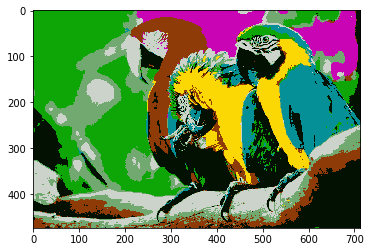

In [12]:
check(y,features)